# Contents
- Data Load
- EDA
- Feature Engineering & Preprocessing
- Modeling
- Analysis

# import

In [ ]:
import warnings
warnings.filterwarnings('ignore')

import os
from os.path import join

import pandas as pd
import numpy as np

# 시각화
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno

#Model
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import KFold, cross_val_score, GridSearchCV
from sklearn.metrics import mean_squared_error
import lightgbm as lgb

# 전처리
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans


%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import gc

# Load Dataset

In [ ]:
# dataset 경로 설정
data_dir = '~/aiffel/kaggle_kakr_housing/data/'


train_data_path = join(data_dir, 'train.csv')
sub_data_path = join(data_dir, 'test.csv')
print(train_data_path)
print(sub_data_path)

/content/drive/MyDrive/Colab Notebooks/Kaggle/data/train.csv
/content/drive/MyDrive/Colab Notebooks/Kaggle/data/test.csv


In [82]:
# dataset 로드 후 확인
train = pd.read_csv(train_data_path)
test = pd.read_csv(sub_data_path)
print(train.shape, test.shape)
train.head()

(15035, 21) (6468, 20)


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,0,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,1,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
2,2,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503
3,3,20140627T000000,257500.0,3,2.25,1715,6819,2.0,0,0,...,7,1715,0,1995,0,98003,47.3097,-122.327,2238,6819
4,4,20150115T000000,291850.0,3,1.50,1060,9711,1.0,0,0,...,7,1060,0,1963,0,98198,47.4095,-122.315,1650,9711


# EDA

In [83]:
# eda용 data
eda_data = train.copy()

In [84]:
eda_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15035 entries, 0 to 15034
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             15035 non-null  int64  
 1   date           15035 non-null  object 
 2   price          15035 non-null  float64
 3   bedrooms       15035 non-null  int64  
 4   bathrooms      15035 non-null  float64
 5   sqft_living    15035 non-null  int64  
 6   sqft_lot       15035 non-null  int64  
 7   floors         15035 non-null  float64
 8   waterfront     15035 non-null  int64  
 9   view           15035 non-null  int64  
 10  condition      15035 non-null  int64  
 11  grade          15035 non-null  int64  
 12  sqft_above     15035 non-null  int64  
 13  sqft_basement  15035 non-null  int64  
 14  yr_built       15035 non-null  int64  
 15  yr_renovated   15035 non-null  int64  
 16  zipcode        15035 non-null  int64  
 17  lat            15035 non-null  float64
 18  long  


- date : object형 이므로 전처리 필수
- 전체 데이터 non-null이지만, null아닌 다른 형태의 결측치 있는지 확인할 것


## 1.결측치 확인


<Axes: >

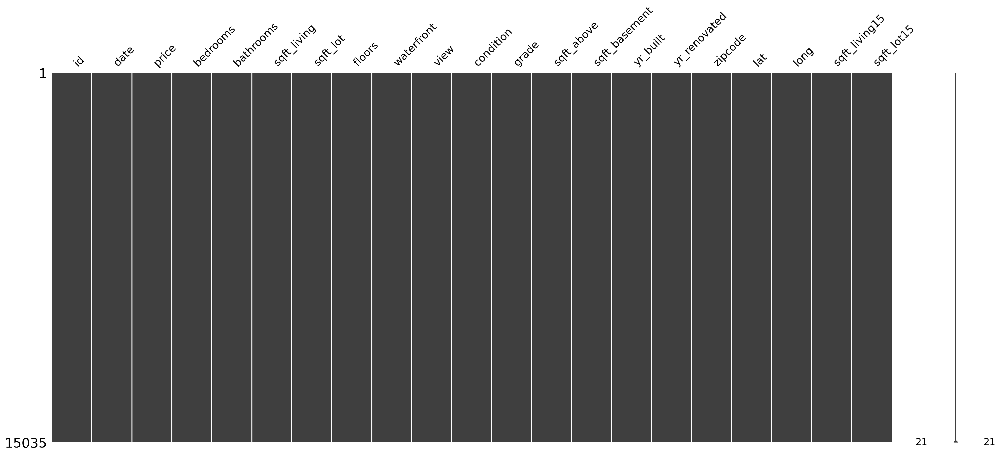

In [85]:
msno.matrix(eda_data)

- msno 결과 역시 결측치 없음,
- 0이 나오면 이상한 데이터 :
['bedrooms', 'bathrooms', 'sqft_living','sqft_lot', 'floors', 'view', 'condition', 'grade','sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long', 'sqft_living15', 'sqft_lot15']

## 2.Feature 확인
```
- bedrooms : 침실의 수
- bathrooms : 침실당 화장실 개수
- floors : 집의 층수

- date: 집을 구매한 날짜

- waterfront : 집의 전방에 강이 흐르는지 유무 (a.k.a. 리버뷰)
- view : 집이 얼마나 좋아 보이는지의 정도 (0-4 idx)
- condition : 집의 전반적인 상태 (1-5 idx)
- grade : King County grading 시스템 기준으로 매긴 집의 등급 (1-13 idx)

- zipcode : 우편번호
- lat : 위도
- long : 경도

- yr_built : 집을 지은 년도
- yr_renovated : 집을 재건축한 년도

- sqft_living : 주거 공간의 평방 피트
- sqft_lot : 부지의 평방 피트
- sqft_above : 지하실을 제외한 평방 피트
- sqft_basement : 지하실의 평방 피트
- sqft_living15 : 근처 15 가구의 주거 공간, 평방 피트
- sqft_lot15 : 근처 15가구의 부지, 평방 피트
```

- view, condition, grade에 대한 정보가 부족해 캐글 discussion 참고함.

- view - An index from 0 to 4 of how good the view of the property was
- condition - An index from 1 to 5 on the condition of the apartment,
- grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an - average level of construction and design, and 11-13 have a high quality level of construction and design.

### (1) 통계값 확인

In [86]:
# 데이터 통계값 확인
eda_data.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,15035.000000,1.503500e+04,15035.000000,15035.000000,15035.000000,1.503500e+04,15035.000000,15035.000000,15035.000000,15035.000000,15035.000000,15035.000000,15035.000000,15035.000000,15035.000000,15035.000000,15035.000000,15035.000000,15035.000000,15035.000000
mean,7517.000000,5.406827e+05,3.369139,2.115065,2083.790223,1.529697e+04,1.498071,0.007117,0.234253,3.406651,7.660725,1794.158164,289.632059,1971.100432,83.798936,98078.031726,47.560721,-122.213677,1992.754772,12823.884935
std,4340.374984,3.715247e+05,0.902721,0.767519,922.134087,4.261282e+04,0.538522,0.084063,0.763376,0.646505,1.179803,831.738609,440.663284,29.407612,400.398498,53.297815,0.138164,0.141294,691.456442,27736.259787
min,0.000000,7.800000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,3758.500000,3.220000e+05,3.000000,1.750000,1430.000000,5.027500e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.472700,-122.328000,1490.000000,5100.000000
50%,7517.000000,4.500000e+05,3.000000,2.250000,1910.000000,7.620000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1570.000000,0.000000,1975.000000,0.000000,98065.000000,47.571900,-122.231000,1850.000000,7610.000000
75%,11275.500000,6.450000e+05,4.000000,2.500000,2560.000000,1.069550e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2230.000000,550.000000,1997.000000,0.000000,98117.000000,47.678300,-122.126000,2360.000000,10076.000000
max,15034.000000,7.700000e+06,10.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4130.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [87]:
# 혹시 모를 id중복 확인
len(pd.unique(eda_data['id']))

15035

- 역시 유니크 id값 이므로 학습 시 제외한다

### (2) 전체 feature distribution 확인

In [88]:
# object형인 date와, 유니크 값인 'id'는 제외함
features=['price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15']

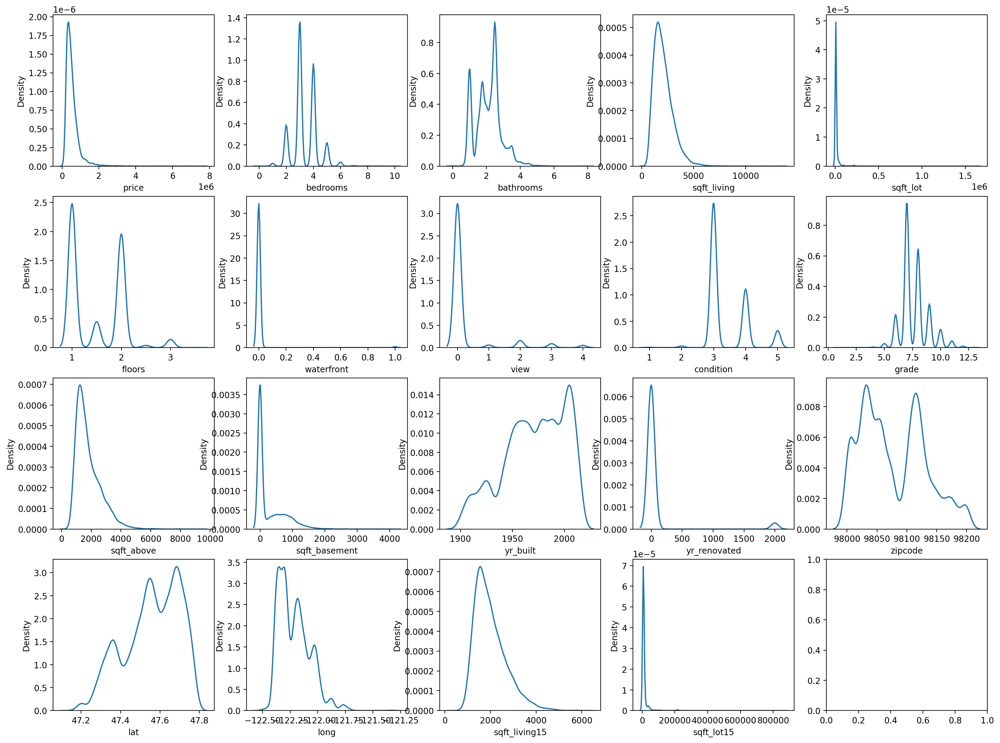

In [89]:
# id, date를 데외한 feature들의 distribution을 확인한다.
fig, axes = plt.subplots(4, 5, figsize = (20, 15))
for ax, feature in zip(axes.flatten(), features):
    sns.kdeplot(eda_data[feature],ax=ax)

- log 변환이 필요해보이는 column들은 다음과 같음
```
['price','sqft_living', 'sqft_lot', 'sqft_above', 'sqft_basement','sqft_living15', 'sqft_lot15']
```

***로그 변환***

In [90]:
# log 변환 (각 변환 feature마다 _log 붙임)
log_features=['price','sqft_living', 'sqft_lot', 'sqft_above', 'sqft_basement', 'sqft_living15', 'sqft_lot15']
eda_data[[f'{col}_log' for col in log_features]] = eda_data[log_features].apply(np.log1p)
eda_data.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15', 'price_log',
       'sqft_living_log', 'sqft_lot_log', 'sqft_above_log',
       'sqft_basement_log', 'sqft_living15_log', 'sqft_lot15_log'],
      dtype='object')

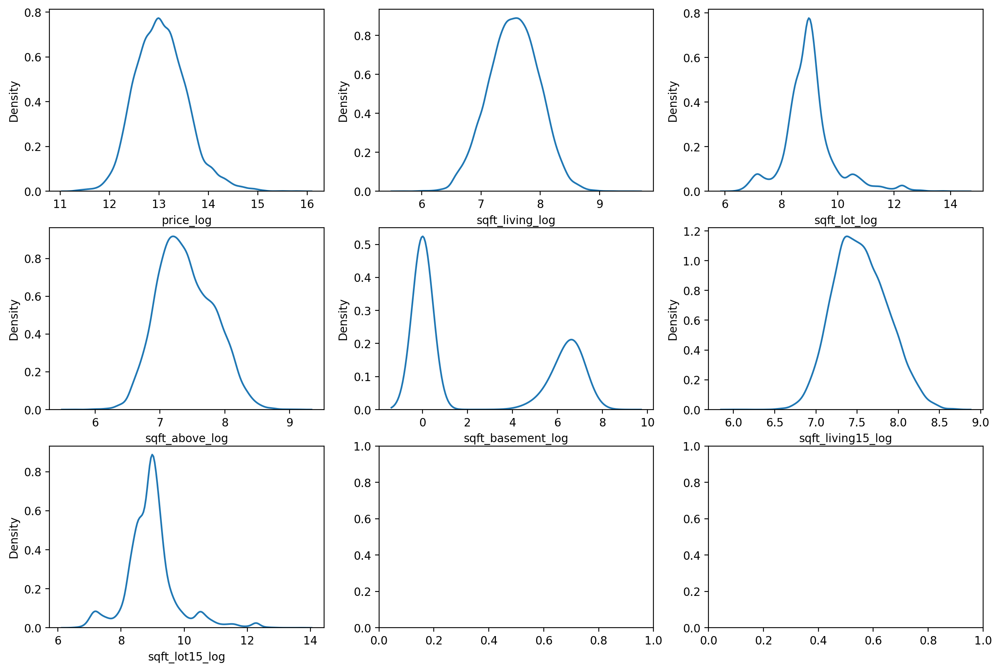

In [91]:
# log변환 데이터들의 distribution 확인
fig, axes = plt.subplots(3, 3, figsize = (15, 10))
for ax, feature in zip(axes.flatten(), log_features):
    sns.kdeplot(eda_data[f"{feature}_log"],ax=ax)

### (3) 관계 확인


***이제 feature와 price의 관계를 살펴봄***

    - 범주형
        - waterfront : 집의 전방에 강이 흐르는지 유무 (a.k.a. 리버뷰)
        - view : 집이 얼마나 좋아 보이는지의 정도 (0-4 idx)
        - condition : 집의 전반적인 상태 (1-5 idx)
        - grade : King County grading 시스템 기준으로 매긴 집의 등급 (1-13 idx)
    - 수치형 (비연속)
        - bedrooms : 침실의 수
        - floors : 집의 층수
        - zipcode : 우편번호
        - yr_built : 집을 지은 년도
        - yr_renovated : 집을 재건축한 년도
    - 수치형 (연속)
        - bathrooms : 침실당 화장실 개수
        - lat : 위도
        - long : 경도
        - sqft_living(log) : 주거 공간의 평방 피트
        - sqft_lot(log) : 부지의 평방 피트
        - sqft_above(log) : 지하실을 제외한 평방 피트
        - sqft_basement(log) : 지하실의 평방 피트
        - sqft_living15(log) : 근처 15 가구의 주거 공간, 평방 피트
        - sqft_lot15(log) : 근처 15가구의 부지, 평방 피트
    - 정답
        - price (log)
    - 논외(추후 처리 예정)
        - date: 집을 구매한 날짜(아마 비연속 수치형)

        log_features=['price','sqft_living', 'sqft_lot', 'sqft_above', 'sqft_basement', 'sqft_living15', 'sqft_lot15']

#### ***Correlation 확인***

In [92]:
# correlation map 그리는 함수
def plot_correlation(df, exclude_features = ['id', 'date']):
    filtered_df = df.drop(exclude_features, axis=1,errors='ignore') #exclude 없으면 에러무시
    corr = filtered_df.corr()

    plt.figure(figsize=(10, 10))
    sns.heatmap(corr, annot=True, cmap='bwr', annot_kws={'size': 7})
    plt.gca().xaxis.set_ticks_position('top') #x축 표기를 위로 이동
    plt.xticks(rotation=90) #x축 표기 90도 회전
    plt.show()

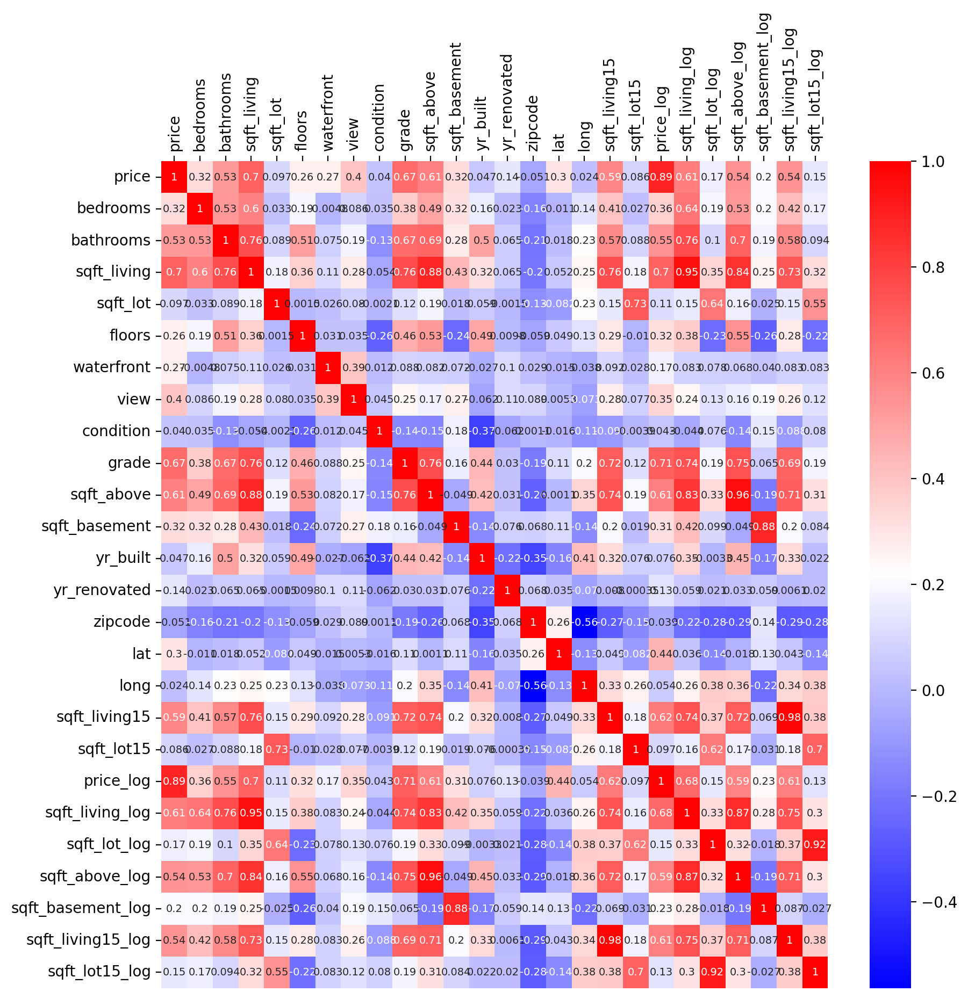

In [93]:
plot_correlation(eda_data)

- log변환 후 몇몇 feature에 대한 상관관계 증가함

#### ***범주형 데이터***

Price_log와의 관계 확인

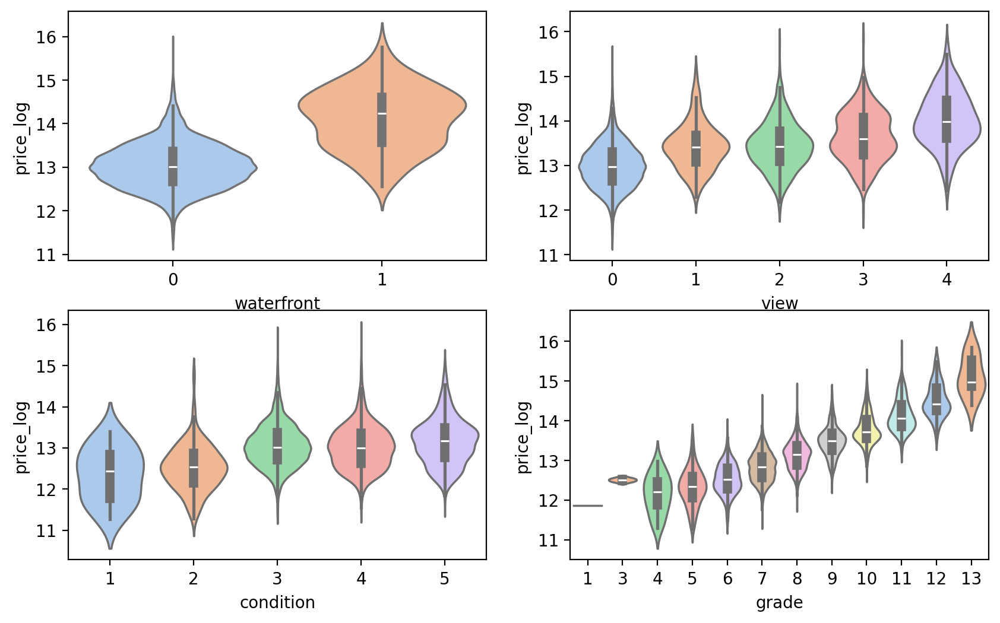

In [94]:
# 범주형 데이터 확인
categorical_features = ['waterfront', 'view', 'condition', 'grade']
fig, axes = plt.subplots(2, 2, figsize=(10, 6))
for ax, feature in zip(axes.flatten(), categorical_features ):
    sns.violinplot(x=eda_data[feature], y=eda_data['price_log'], ax=ax, palette='pastel')

- grade 3의 바이올린 플랏이 좀 이상하다. 따로 뽑아보자

In [95]:
#grade ==3 인 data 확인
print(eda_data[eda_data['grade'] == 3].to_string())
# 삭제할 data id : 2302,4123

        id             date     price  bedrooms  bathrooms  sqft_living  sqft_lot  floors  waterfront  view  condition  grade  sqft_above  sqft_basement  yr_built  yr_renovated  zipcode      lat     long  sqft_living15  sqft_lot15  price_log  sqft_living_log  sqft_lot_log  sqft_above_log  sqft_basement_log  sqft_living15_log  sqft_lot15_log
2302  2302  20150225T000000  262000.0         1       0.75          520     12981     1.0           0     0          5      3         520              0      1920             0    98022  47.2082 -121.995           1340       12233  12.476104         6.255750      9.471319        6.255750                0.0           7.201171        9.411974
4123  4123  20141104T000000  280000.0         1       0.00          600     24501     1.0           0     0          2      3         600              0      1950             0    98045  47.5316 -121.749            990       22549  12.542548         6.398595     10.106510        6.398595                0.0       

- 데이터 수가 너무 작고, 혼자 팍 튀어서 이상치로 볼 수 있을 것 같다. 나중에 Feature Engineering단계에서 빼준다.

#### ***수치형 비연속 데이터***

Price_log와의 관계 확인

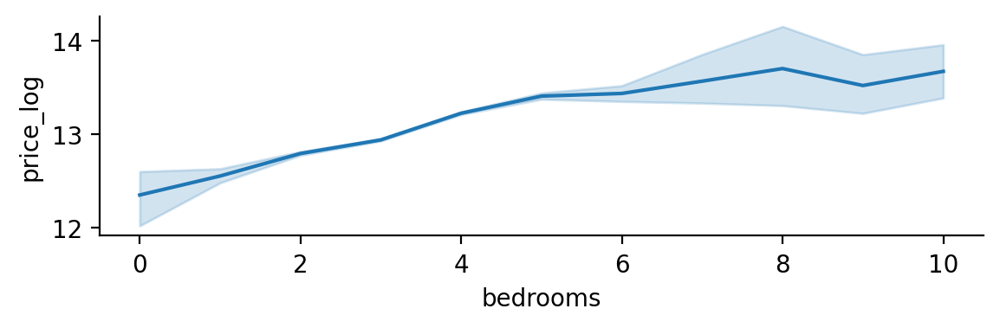

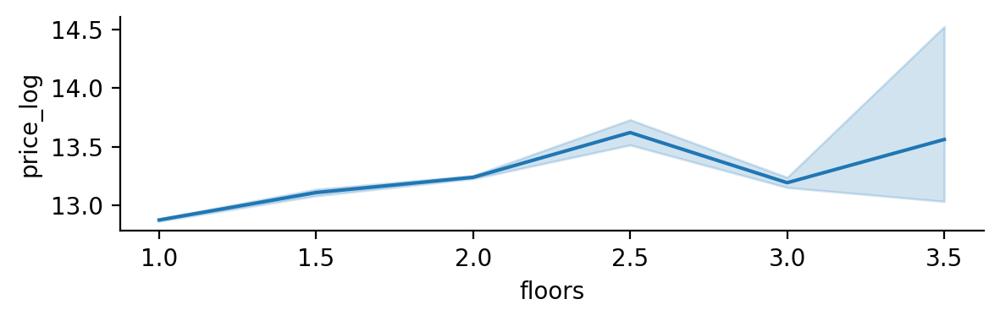

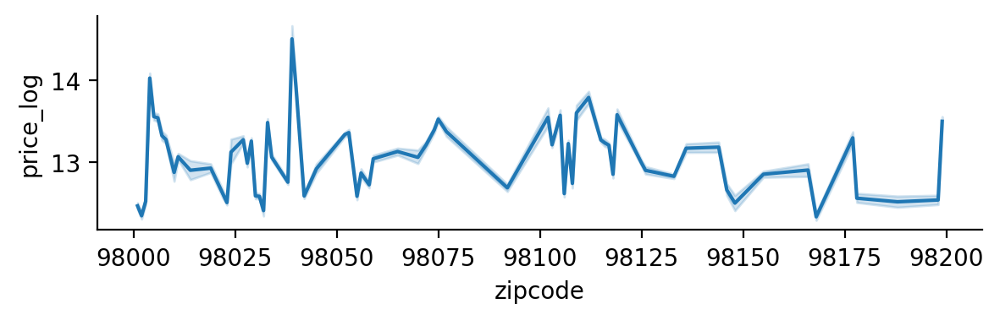

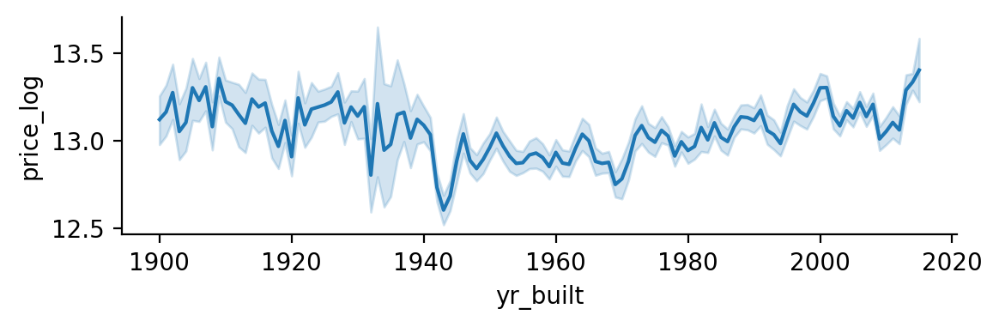

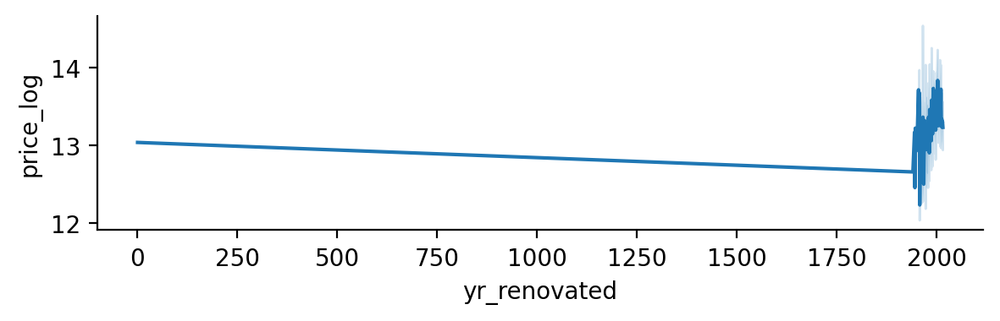

In [96]:
# 수치형 비연속 데이터 확인
numerical_features = ['bedrooms', 'floors', 'zipcode', 'yr_built', 'yr_renovated']

for feature in numerical_features:
    sns.relplot(
    data=eda_data,
    x=feature,
    y='price_log',
    kind='line',
    height = 2,
    aspect = 3,# 가로 2*3 사이즈
)

- 우편번호는 큰 관계성을 알 수 없음.
- 의외로 1900년대보다 1940년대 건축물이 더 싸다. 재건축의 영향일까?
- 재건축 하지 않은 경우에는 yr_renovated값이 0이므로 이런 그래프가 나온 것 같다,
- 건축연도와 재건축 연도는 복합적으로 고려해야 할 것 같다. 이 feature만 따로 봐야겠다.

In [97]:
# 재건축 여부 컬럼 추가
eda_data['renovated']=eda_data['yr_renovated'].apply(lambda x:1 if x>0 else 0)

<Axes: xlabel='renovated', ylabel='price_log'>

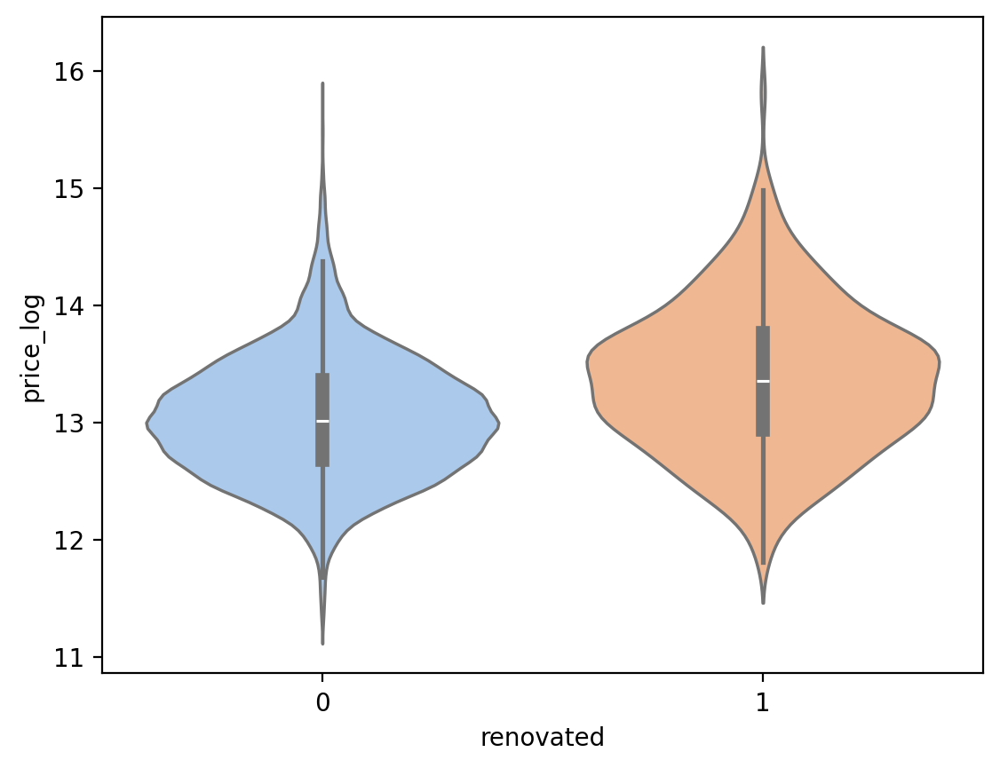

In [98]:
sns.violinplot(x=eda_data['renovated'], y=eda_data['price_log'], palette='pastel')

- 미약하게 재건축 한 집이 더 비싸긴 하다.

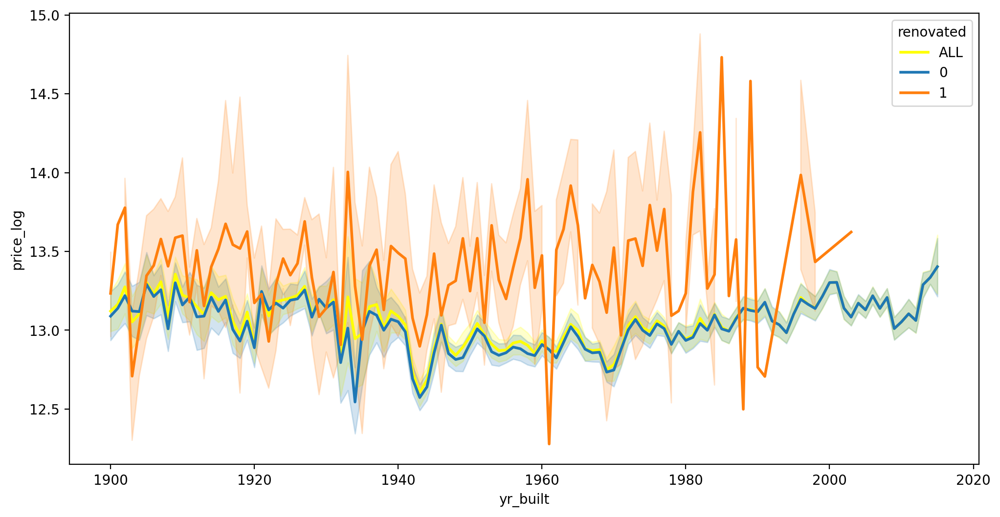

In [99]:
plt.figure(figsize=(12, 6))
sns.lineplot(
    data=eda_data,
    x='yr_built',
    y='price_log',
    label='ALL',
    color='yellow',
    linewidth=2
)
sns.lineplot(
    data=eda_data,
    x='yr_built',
    y='price_log',
    hue='renovated',
    linewidth=2
)
plt.show()


- 건축 연도별 집값 그래프(전체, 재건축X, 재건축O)
- 동일 연도에 건축한 집 중에서는 역시 재건축한 집이 더 비싸다

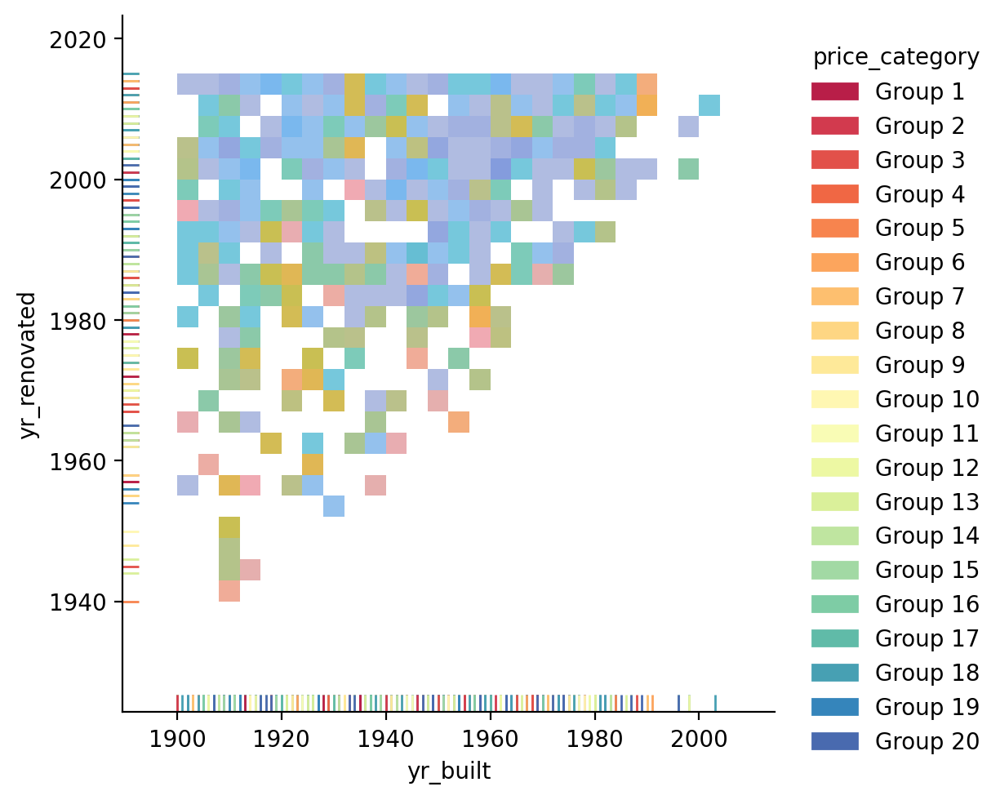

In [100]:
# 건축 년도와 재건축 년도에 따른 집값
# 집값을 보기 위해서 집값을 임시로 20개 범주로 카테고리화 한다.
num_groups = 20
price_labels = [f'Group {i+1}' for i in range(num_groups)]
eda_data['price_category'] = pd.qcut(eda_data['price_log'], q=num_groups, labels=price_labels)

sns.displot(
    data=eda_data[eda_data['renovated']==1],
    x='yr_built',
    y='yr_renovated',
    hue='price_category',
    height=5,
    rug=True,
    palette = "Spectral",
    binwidth=(4, 3)
)

- 재건축 년도가 최근일 수록 집 가격은 올라가는 것으로 보임
- 더 정확한 이해를 위해서 둘을 합쳐서 보는 것도 필요할 듯

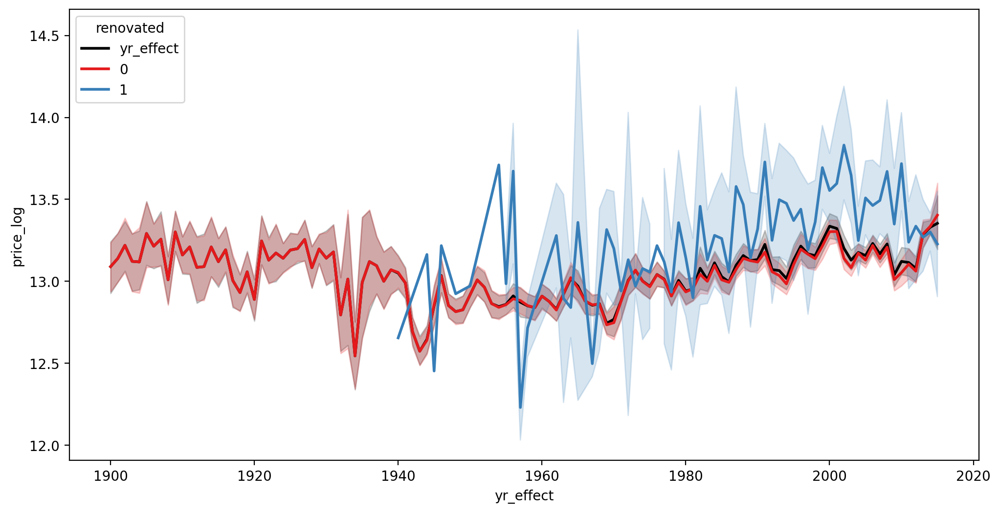

In [101]:
# 재건축했다면 재건축 년도로, 아니면 건축년도로 하는 컬럼 추가
eda_data['yr_effect']=eda_data.apply(
    lambda x: x['yr_renovated'] if x['renovated']==1 else x['yr_built'], axis=1
)

plt.figure(figsize=(12, 6))
sns.lineplot(
    data=eda_data,
    x='yr_effect',
    y='price_log',
    label='yr_effect',
    color='black',
    linewidth=2
)

sns.lineplot(
    data=eda_data,
    x='yr_effect',
    y='price_log',
    hue='renovated',
    palette='Set1',
    linewidth=2
)
plt.show()

- 일단 재건축한집이 당해에 건축한 집보다 약간 높은 가격을 형성한 것 같다. 근데 분산이 커서 확정짓기는 어렵다


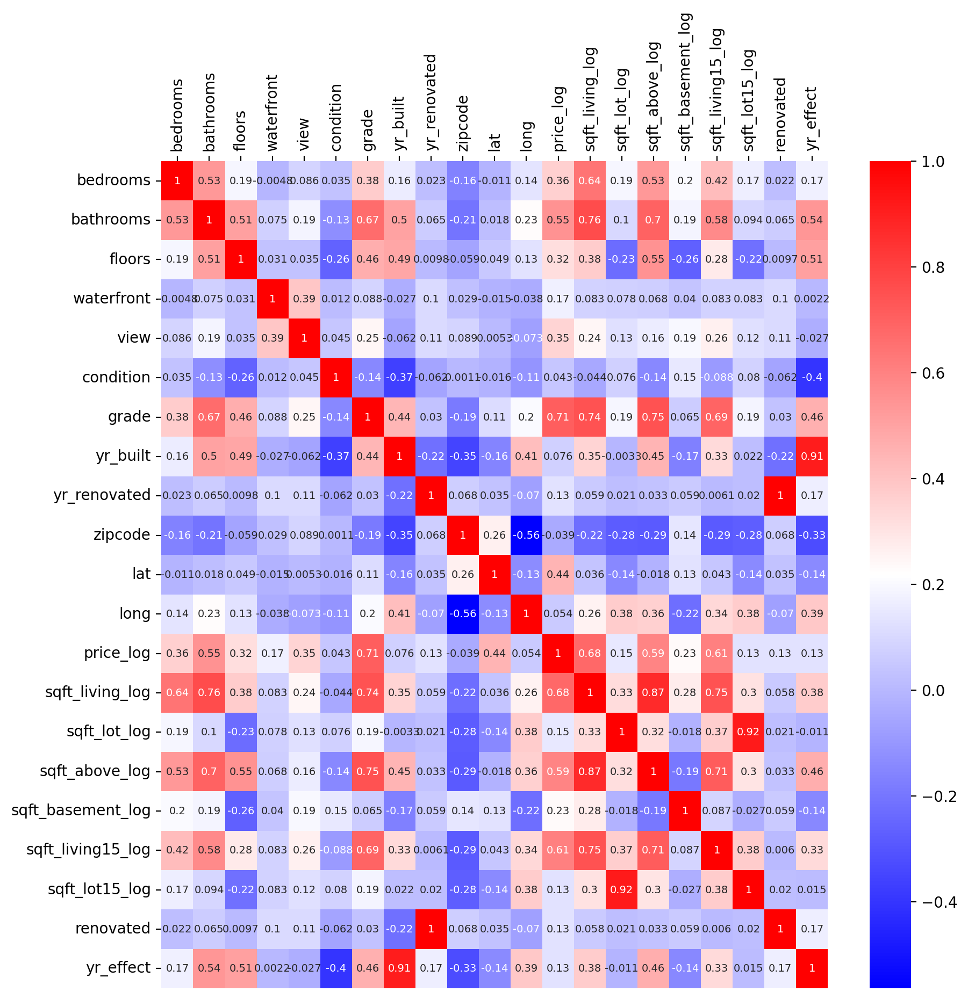

In [104]:
exclude_features = log_features + ['id', 'date','price_category']
plot_correlation(eda_data,exclude_features)

- **yr_built와 yr_renovaative 대체하여 renovated와 yr_effect를 사용해야겠다**
    - renovated는 yr_renovated만 없으면 다른 컬럼에 대한 의존성이 매우 낮기 때문
    - yr_effect의 경우 built보다 target과 correlation이 높고, yr_renovated와 비슷하기 때문
    

#### ***수치형 연속 데이터***

Price_log와의 관계 확인
```
- bathrooms : 침실당 화장실 개수
- lat : 위도
- long : 경도
- sqft_living(log) : 주거 공간의 평방 피트
- sqft_lot(log) : 부지의 평방 피트
- sqft_above(log) : 지하실을 제외한 평방 피트
- sqft_basement(log) : 지하실의 평방 피트
- sqft_living15(log) : 근처 15 가구의 주거 공간, 평방 피트
- sqft_lot15(log) : 근처 15가구의 부지, 평방 피트
```

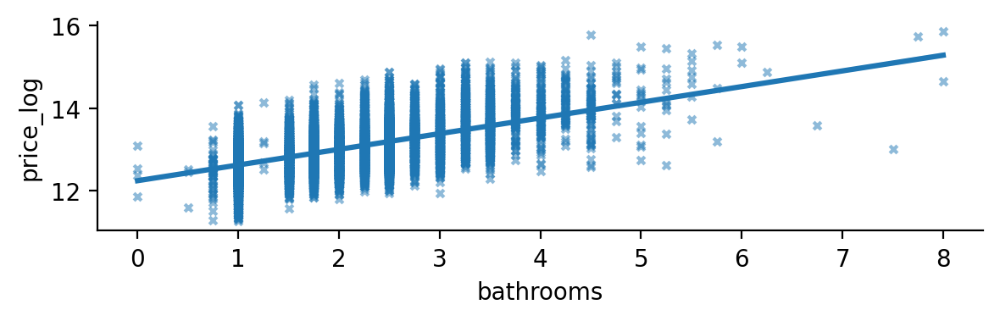

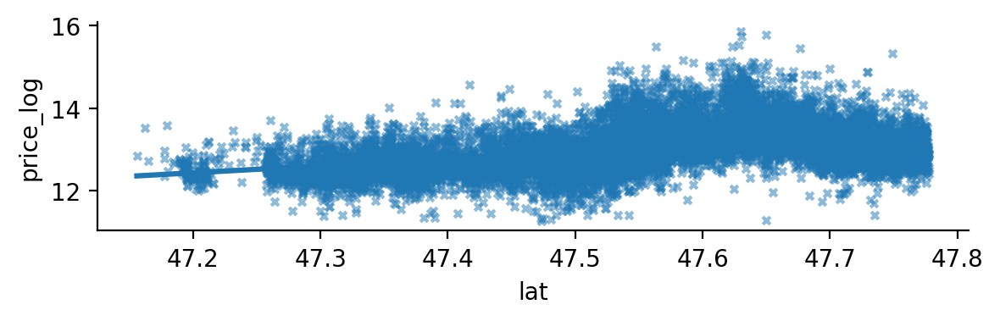

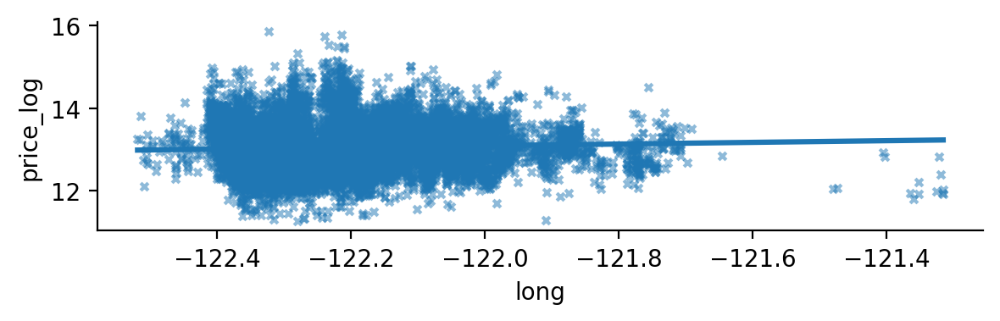

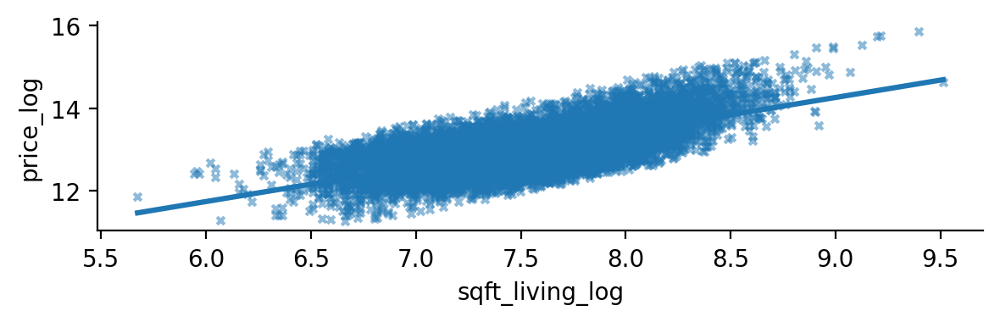

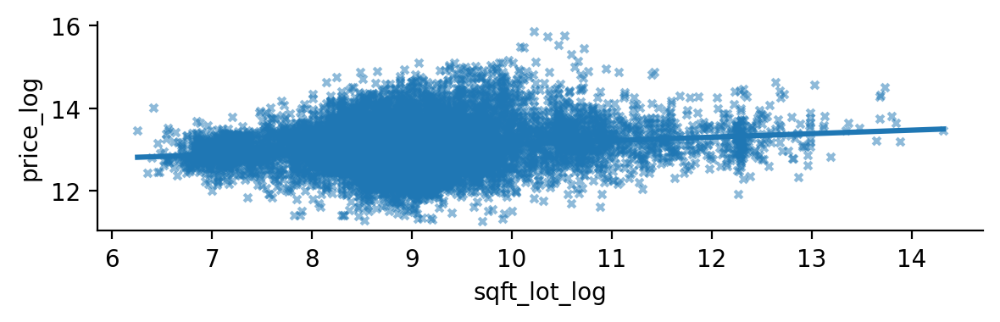

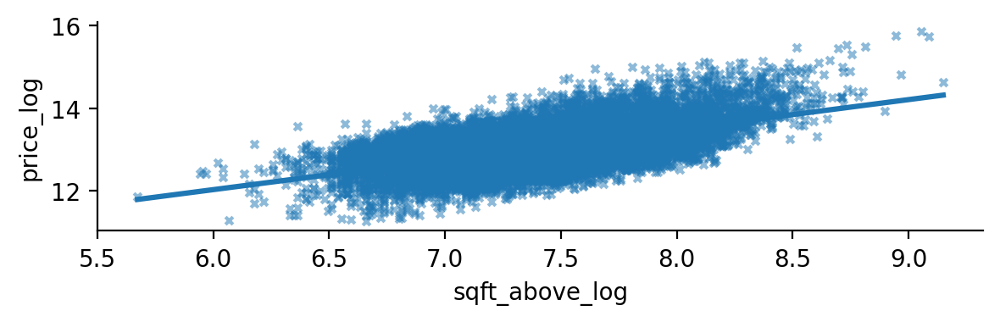

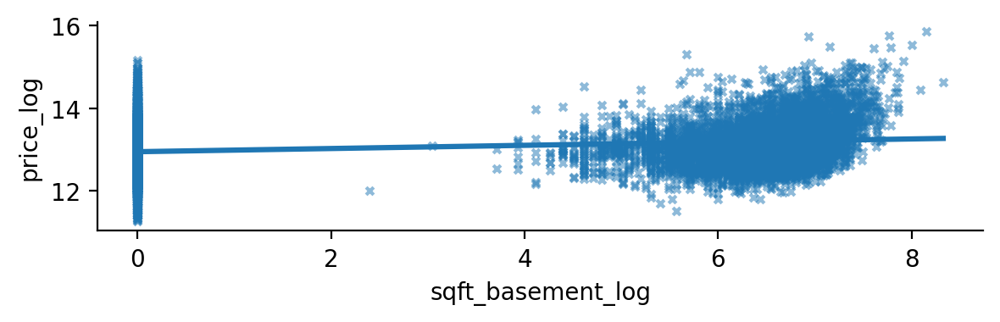

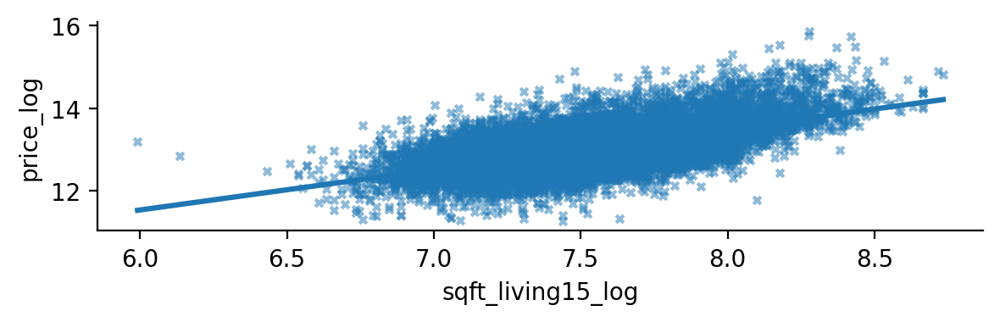

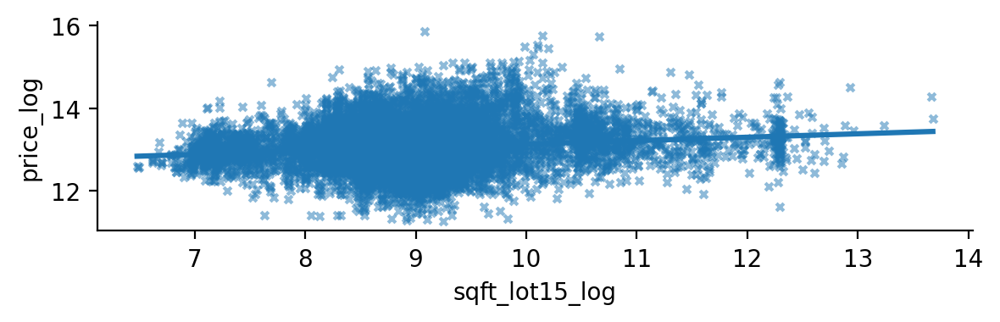

In [105]:
continuous_features = ['bathrooms', 'lat', 'long', 'sqft_living_log', 'sqft_lot_log', 'sqft_above_log', 'sqft_basement_log', 'sqft_living15_log', 'sqft_lot15_log']
for feature in continuous_features:
    sns.lmplot(
    data=eda_data,
    x=feature,
    y="price_log",
    height=2,
    aspect=3,
    markers='x',
    scatter_kws={"s": 10, "alpha":0.5}
)


- 이상치 확인
- 위도 경도, 우편번호가 위치를 나타내는 데이터인 만큼, 따로 빼서 봐야 할듯

In [115]:
# price
eda_data[(eda_data['bathrooms'] > 7) & (eda_data['price_log'] < 13.5)]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,price_log,sqft_living_log,sqft_lot_log,sqft_above_log,sqft_basement_log,sqft_living15_log,sqft_lot15_log,renovated,price_category,yr_effect
5108,5108,20141013T000000,7700000.0,6,8.00,12050,27600,2.5,0,3,...,15.856731,9.396903,10.225607,9.056140,8.155075,8.279190,9.082621,1,Group 20,1987
6469,6469,20140919T000000,6885000.0,6,7.75,9890,31374,2.0,0,4,...,15.744856,9.199381,10.353767,9.089415,6.938284,8.420903,10.662680,0,Group 20,2001
8912,8912,20140505T000000,2280000.0,7,8.00,13540,307752,3.0,0,4,...,14.639686,9.513477,12.637053,9.149634,8.326275,8.486940,12.291337,0,Group 20,1999


In [121]:
eda_data[(eda_data['sqft_living15_log']<7)&(eda_data['price_log']>13.7)]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,price_log,sqft_living_log,sqft_lot_log,sqft_above_log,sqft_basement_log,sqft_living15_log,sqft_lot15_log,renovated,price_category,yr_effect
1287,1287,20150414T000000,950000.0,4,3.00,2420,4800,1.5,0,0,...,13.764218,7.791936,8.476580,7.327123,6.803505,6.994850,8.243019,0,Group 19,1919
4247,4247,20150421T000000,925000.0,4,2.50,3350,4501,2.0,0,0,...,13.737550,8.117014,8.412277,7.878913,6.566672,6.908755,8.412055,0,Group 19,2002
4642,4642,20141020T000000,908800.0,3,3.00,3420,7826,2.0,0,0,...,13.719881,8.137688,8.965335,7.796058,6.898715,6.888572,8.748464,0,Group 19,1939
6398,6398,20140804T000000,898500.0,4,2.75,2890,5000,1.5,0,0,...,13.708483,7.969358,8.517393,7.596392,6.803505,6.985642,8.229778,1,Group 19,2014


#### ***우편번호, 위도 , 경도***

<Axes: xlabel='long', ylabel='lat'>

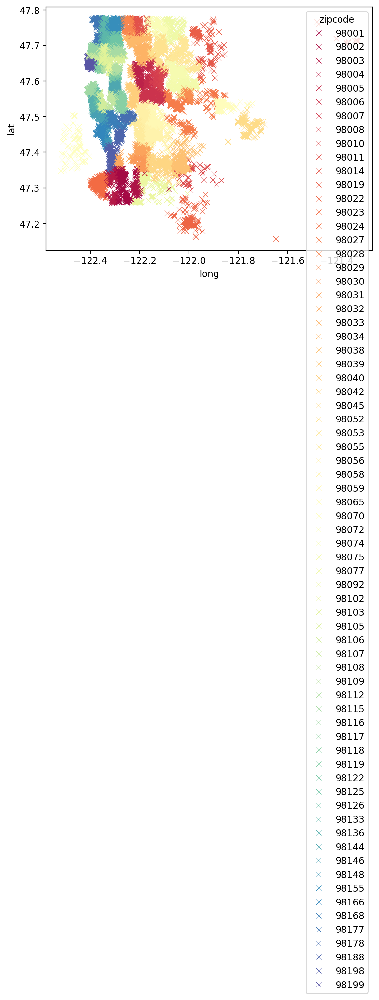

In [ ]:
sns.scatterplot(
    data=eda_data,
    x='long',
    y='lat',
    palette=sns.color_palette("Spectral", n_colors=eda_data['zipcode'].nunique()),
    hue='zipcode',
    marker='x',
)

<Axes: xlabel='long', ylabel='lat'>

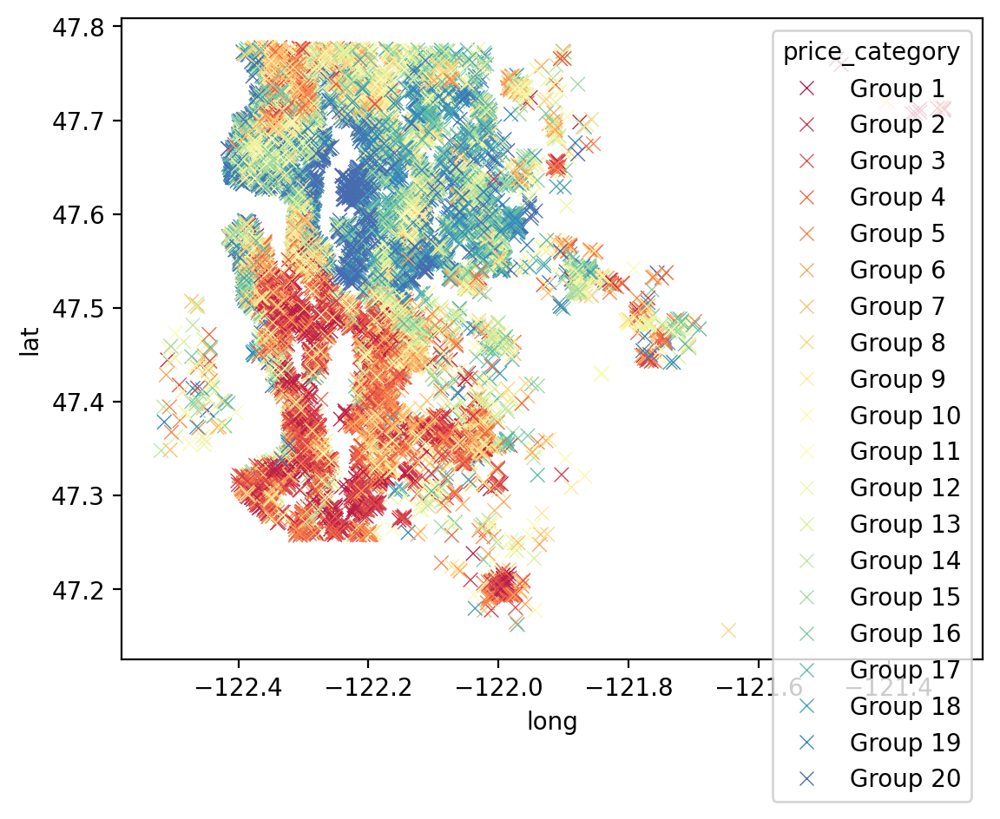

In [ ]:
sns.scatterplot(
    data=eda_data,
    y='lat',
    x='long',
    hue='price_category',
    palette = "Spectral",
    marker='x',
)

- 위도, 경도, 우편번호 모두 집값과 관련이 있어보인다. 특히 위도가 큰 상관성이 있어보인다. (집값이 비싼동네가 있는 것 같다)
- 일단 생각나는 방법은 PCA사용이다. 위도, 경도에 PCA를 사용하면 각 구역이 더 잘 나눠질 수 있을 것 같다.
- 두번째는 위도, 경도, 우편번호를 이용한 클러스터링이다. 우편번호 체계는 잘 모르지만, 비슷한 동네는 비슷한 우편번호를 가지고 있는 것으로 보인다. 클러스터링 후 각 클러스터 별로 집값의 차이가 있다면, 그를 기준으로 적절한 라벨링을 수행할 수 있을 것이다.

**위도, 경도 PCA**

<Axes: xlabel='PCA2', ylabel='PCA1'>

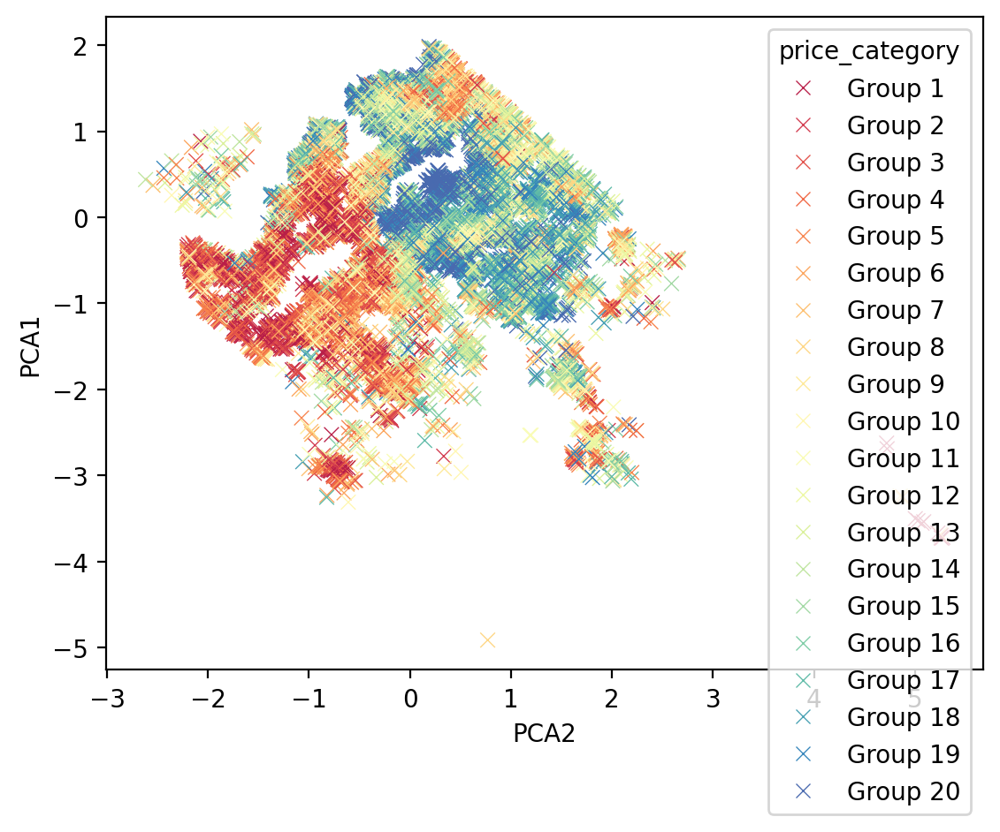

In [ ]:
pca_features = eda_data[['lat', 'long']]

scaler = StandardScaler()
scaled_features = scaler.fit_transform(pca_features)

# PCA 수행 (2차원으로 (차원축소X))
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_features)

# 결과를 DataFrame으로 저장
eda_data['PCA1'] = pca_result[:, 0]
eda_data['PCA2'] = pca_result[:, 1]

sns.scatterplot(
    data=eda_data,
    y='PCA1',
    x='PCA2',
    hue='price_category',
    palette = "Spectral",
    marker='x',
)

***위도, 경도, 우편번호, 집값 기준 클러스터링***

<Axes: xlabel='long', ylabel='lat'>

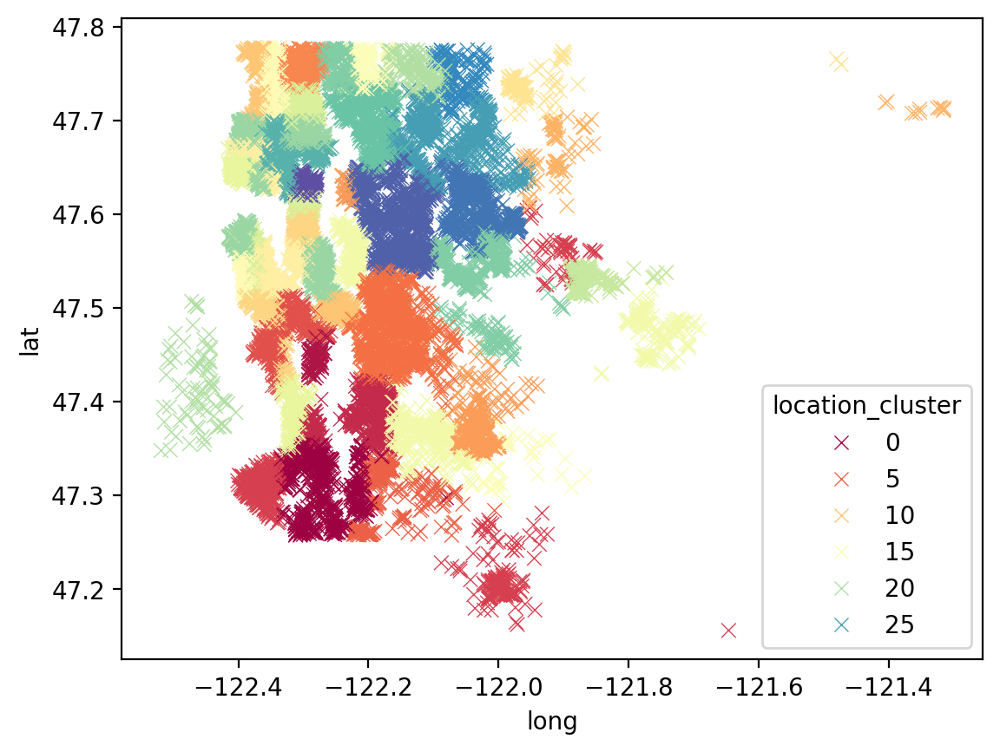

In [ ]:
from sklearn.cluster import KMeans

# 위치정보 + 가격 기반 클러스터링
features_for_cluster = eda_data[['PCA1', 'PCA2', 'zipcode']]
kmeans = KMeans(n_clusters=30, random_state=42)
eda_data['raw_cluster'] = kmeans.fit_predict(features_for_cluster)

#클러스터별 평균 가격 계산
cluster_price = (
    eda_data.groupby('raw_cluster')['price_log']
    .mean()
    .sort_values()
    .reset_index()
)
# 가격 순으로 재정렬된 클러스터 번호 만든다
cluster_price['cluster_label'] = range(len(cluster_price))

# 원래 클러스터 번호와 새로운 번호 매핑을 위해서 딕셔너리 만듬
cluster_map = dict(zip(cluster_price['raw_cluster'], cluster_price['cluster_label']))

# 최종 클러스터 라벨 할당
eda_data['location_cluster'] = eda_data['raw_cluster'].map(cluster_map)

# raw_cluster는 삭제한다.
eda_data.drop(columns=['raw_cluster'], inplace=True)

sns.scatterplot(
    data=eda_data,
    y='lat',
    x='long',
    hue='location_cluster',
    palette = "Spectral",
    marker='x',
)

- 지역별로 다음과 같이 클러스터링 되었다.

<Axes: xlabel='location_cluster', ylabel='price_log'>

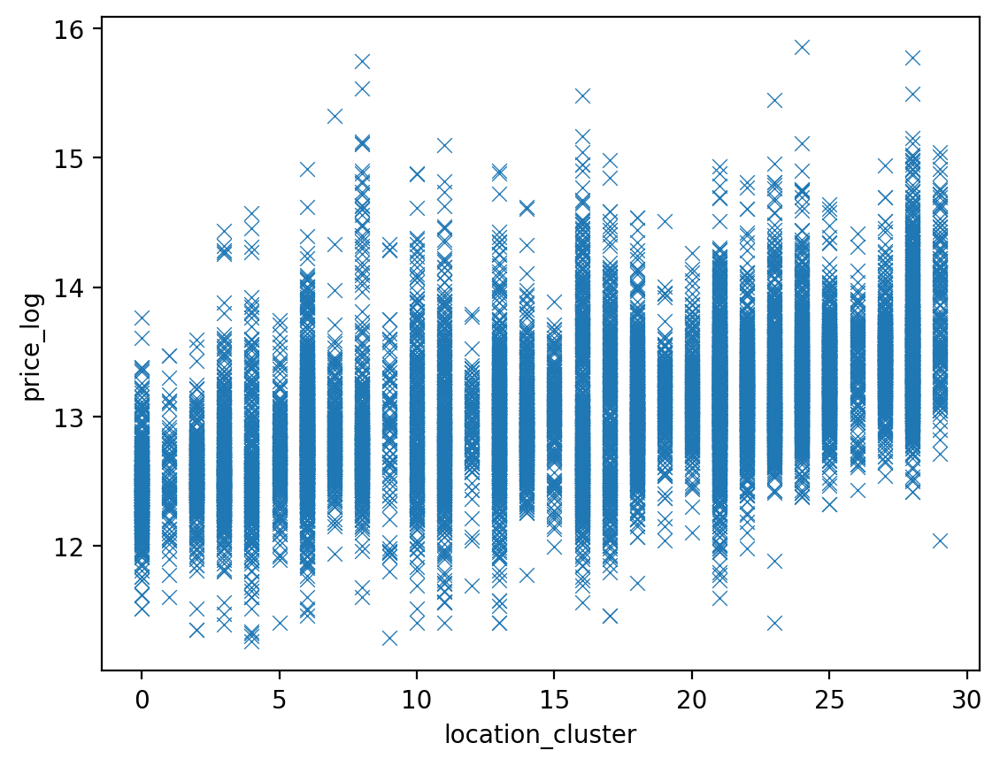

In [ ]:
sns.scatterplot(
    data=eda_data,
    y='price_log',
    x='location_cluster',
    palette = "Spectral",
    marker='x',
)

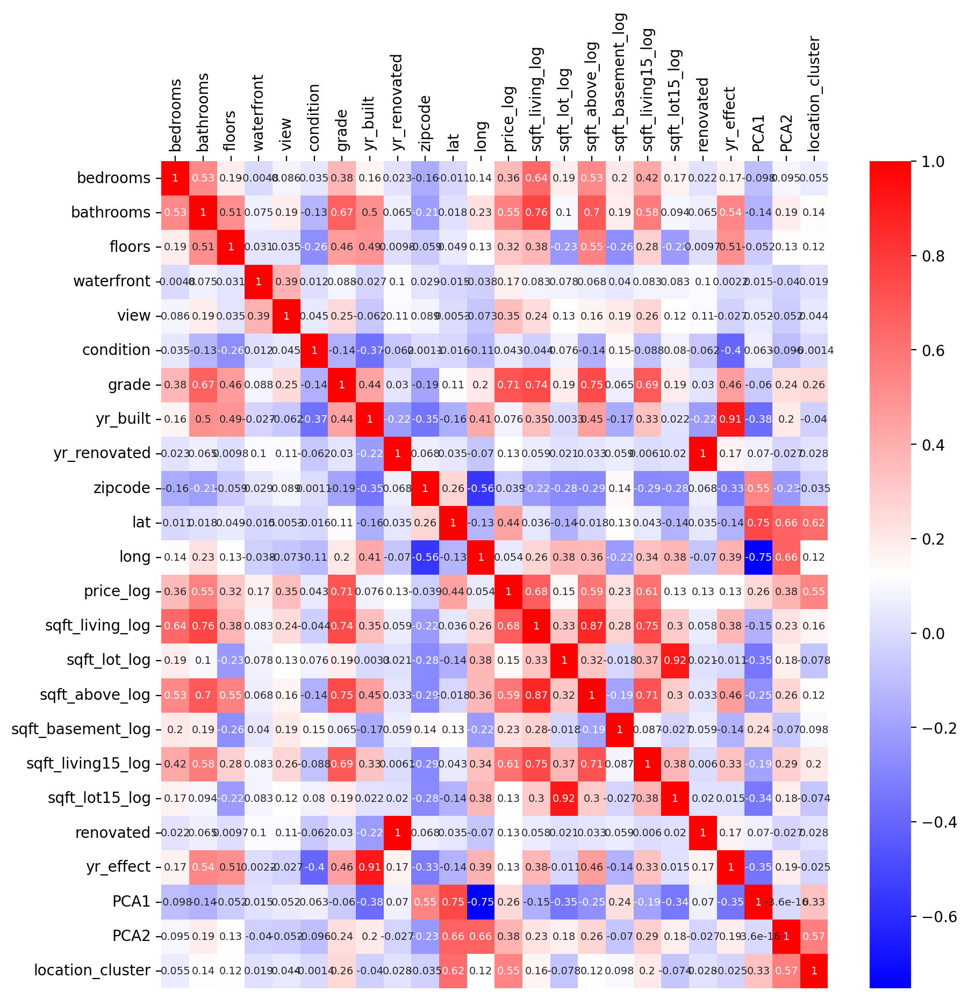

In [ ]:
exclude_features = log_features + ['id', 'date','price_category']
plot_correlation(eda_data,exclude_features)

- 기존보다 더 좋을지는 잘 모르겠음 모델 돌릴때 두가지 케이스 모두 해볼 것

#### ***Date 확인***

<Axes: xlabel='date', ylabel='price_log'>

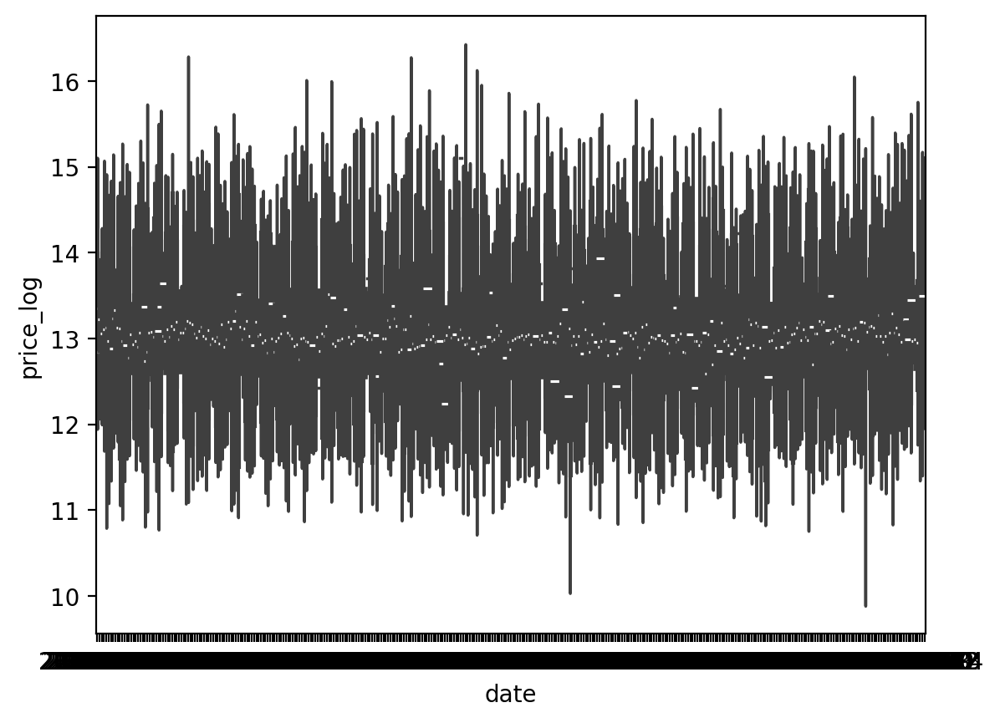

In [ ]:
eda_data['date'] = train['date'].apply(lambda x: int(x.split('T')[0]) if isinstance(x, str) else x)
eda_data['date'].describe()
sns.violinplot(
    data=eda_data,
    y='price_log',
    x='date',
)

- 년,월,일 데이터인데 12달,30일로 이루어져있으니 plot이 이렇게 나올 수 밖에 없다.

In [ ]:
# 일 데이터 제외
eda_data['date'] = eda_data['date'].apply(lambda x: x//100)
eda_data[['date']].head()

,date
0,201410
1,201502
2,201502
3,201406
4,201501


<Axes: xlabel='date', ylabel='price_log'>

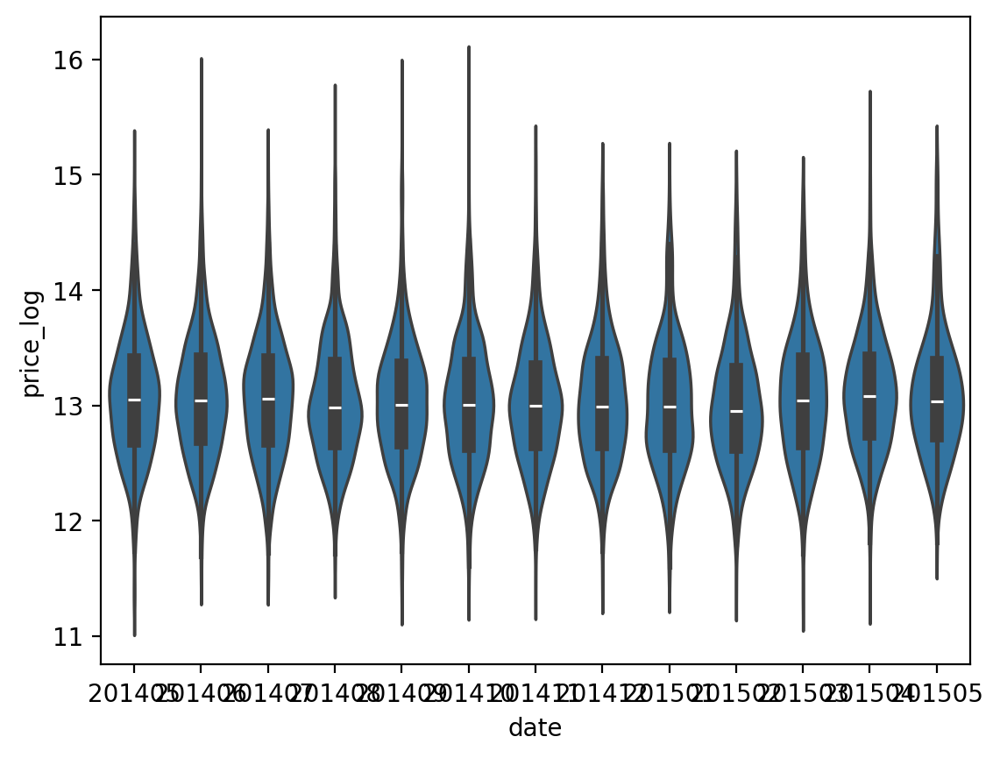

In [ ]:
sns.violinplot(
    data=eda_data,
    x='date',
    y='price_log',
)

# 전처리

- log변환
```log_features=['price','sqft_living', 'sqft_lot', 'sqft_above', 'sqft_basement', 'sqft_living15', 'sqft_lot15']```
- yr_built, yr_renovated : yr_effect, renovated 컬럼으로 대체
- long, lat: PCA적용, (+우편번호,집값)으로 클러스터링
- date 앞부분 6자리만 사용

이상치 제거
- grade : grade=3 인 데이터 이상치 삭제


- 필요없는 컬럼 삭제
    - ```log_features, long,lat,yr_built, yr_renovated ```

In [141]:
train = pd.read_csv(train_data_path)
test = pd.read_csv(sub_data_path)
print(train.shape,test.shape)

(15035, 21) (6468, 20)


In [142]:
train_len = len(train)
y=train['price']
data = pd.concat([train.drop('price', axis=1), test], axis=0)

In [143]:
# log 변환
log_features=['sqft_living', 'sqft_lot', 'sqft_above', 'sqft_basement', 'sqft_living15', 'sqft_lot15']

for feature in log_features:
    data[f'{feature}_log'] = np.log1p(data[feature])
    data.drop(columns=feature, inplace=True)

train = data.iloc[:train_len, :].copy()
test = data.iloc[train_len:, :].copy()

y = np.log1p(y)
train['price'] = y
print(train.shape,test.shape)

(15035, 21) (6468, 20)


In [144]:
# yr_built, yr_renovated : yr_effect, renovated 컬럼으로 대체
train['renovated']=train['yr_renovated'].apply(lambda x:1 if x>0 else 0)
train['yr_effect']=train.apply(
    lambda x: x['yr_renovated'] if x['yr_renovated'] > 0 else x['yr_built'], axis=1
)
train.drop(['yr_built','yr_renovated'],axis=1,inplace=True)

test['renovated']=test['yr_renovated'].apply(lambda x:1 if x>0 else 0)
test['yr_effect']=test.apply(
    lambda x: x['yr_renovated'] if x['yr_renovated'] > 0 else x['yr_built'], axis=1
)
test.drop(['yr_built','yr_renovated'],axis=1,inplace=True)

print(train.shape,test.shape)

(15035, 21) (6468, 20)


In [145]:
#grade = 3 삭제
train = train[train['grade'] != 3]

#
train = train[~((train['bathrooms'] > 7) & (train['price'] < 13.5))]

print(train.shape,test.shape)

(15032, 21) (6468, 20)


In [38]:
# # long, lat PCA적용
# pca_features = train[['lat', 'long']]

# # 스케일링
# scaler = StandardScaler()
# scaled_features = scaler.fit_transform(pca_features)

# # PCA (2차원으로 (차원축소X))
# pca = PCA(n_components=2)
# pca_result = pca.fit_transform(scaled_features)

# train['PCA1'] = pca_result[:, 0]
# train['PCA2'] = pca_result[:, 1]
# train.drop(columns=['lat', 'long'], inplace=True)

# # test data
# scaled_features = scaler.transform(test[['lat', 'long']])
# pca_result = pca.transform(scaled_features)
# test['PCA1'] = pca_result[:, 0]
# test['PCA2'] = pca_result[:, 1]
# test.drop(columns=['lat', 'long'], inplace=True)

# print(train.shape,test.shape)

(15035, 20) (6468, 20)


In [ ]:
# # 우편번호, PCA 데이터로 클러스터링
# features_for_cluster = train[['PCA1', 'PCA2', 'zipcode']]

# kmeans = KMeans(n_clusters=30, random_state=42)
# train['raw_cluster'] = kmeans.fit_predict(features_for_cluster)

# # y값 기준으로 클러스터 넘버 재정의
# train['price'] = y
# cluster_price = (train.groupby('raw_cluster')['price'].mean().sort_values().reset_index())
# cluster_price['cluster_label'] = range(len(cluster_price))

# # 원래 클러스터 번호와 새로운 번호 매핑을 위해서 딕셔너리 만듬
# cluster_map = dict(zip(cluster_price['raw_cluster'], cluster_price['cluster_label']))
# train['location_cluster'] = train['raw_cluster'].map(cluster_map)
# train.drop(columns=['raw_cluster'], inplace=True)

# # test
# features_for_cluster = test[['PCA1', 'PCA2', 'zipcode']]
# test['raw_cluster'] = kmeans.predict(features_for_cluster)
# test['location_cluster'] = test['raw_cluster'].map(cluster_map)
# test.drop(columns=['raw_cluster'], inplace=True)

# print(train.shape,test.shape)

(15035, 22) (6468, 21)


In [146]:
# date 앞부분6자리만 사용
train['date'] = train['date'].apply(lambda x: int(x.split('T')[0]) if isinstance(x, str) else x)
test['date'] = test['date'].apply(lambda x: int(x.split('T')[0]) if isinstance(x, str) else x)

train['date'] = train['date'].apply(lambda x: x//100)
test['date'] = test['date'].apply(lambda x: x//100)

In [147]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15032 entries, 0 to 15034
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 15032 non-null  int64  
 1   date               15032 non-null  int64  
 2   bedrooms           15032 non-null  int64  
 3   bathrooms          15032 non-null  float64
 4   floors             15032 non-null  float64
 5   waterfront         15032 non-null  int64  
 6   view               15032 non-null  int64  
 7   condition          15032 non-null  int64  
 8   grade              15032 non-null  int64  
 9   zipcode            15032 non-null  int64  
 10  lat                15032 non-null  float64
 11  long               15032 non-null  float64
 12  sqft_living_log    15032 non-null  float64
 13  sqft_lot_log       15032 non-null  float64
 14  sqft_above_log     15032 non-null  float64
 15  sqft_basement_log  15032 non-null  float64
 16  sqft_living15_log  15032 no

In [148]:
y = train['price']
X = train.drop(['price','id'], axis=1, errors='ignore')
sub_id=test['id']
sub = test.drop(['id'], axis=1, errors='ignore')
print(X.shape,y.shape)
print(sub_id.shape,sub.shape)

(15032, 19) (15032,)
(6468,) (6468, 19)


# Modeling

In [21]:
xgboost = XGBRegressor(random_state=42)
lightgbm = lgb.LGBMRegressor(random_state=42)
models = [{'model':xgboost, 'name':'XGBoost'}, {'model':lightgbm, 'name':'LightGBM'}]

In [22]:
def get_cv_score(models):
    kfold = KFold(n_splits=5).get_n_splits(X.values)
    for m in models:
        CV_score = np.mean(cross_val_score(m['model'], X=X.values, y=y, cv=kfold))
        print(f"Model: {m['name']}, CV score:{CV_score:.4f}")
get_cv_score(models)

Model: XGBoost, CV score:0.8954
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002064 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2248
[LightGBM] [Info] Number of data points in the train set: 12028, number of used features: 19
[LightGBM] [Info] Start training from score 13.050187
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002291 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2277
[LightGBM] [Info] Number of data points in the train set: 12028, number of used features: 19
[LightGBM] [Info] Start training from score 13.052839
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_row_wise=true` to remove the ov

- Model: XGBoost, CV score:0.8954
- Model: LightGBM, CV score:0.9027
- 시간 상 blending방식 대신 LGBM사용

In [42]:
# 하이퍼파라미터 튜닝을 위한 함수 정의
def rmse(y_test, y_pred):
    return np.sqrt(mean_squared_error(np.expm1(y_test), np.expm1(y_pred)))

def my_GridSearch(model, train, y, param_grid, verbose=2, n_jobs=5):
    gridsearch_model = GridSearchCV(
        model,
        param_grid=param_grid,
        scoring='neg_mean_squared_error',
        cv=5,
        verbose=verbose,
        n_jobs=n_jobs
    )
    gridsearch_model.fit(train,y)
    print("최적 파라미터:", gridsearch_model.best_params_)

    params=gridsearch_model.cv_results_['params']
    scores=gridsearch_model.cv_results_['mean_test_score']

    results = pd.DataFrame(params)
    results['score']=scores

    results['RMSLE'] = np.sqrt(-1 * results['score'])
    results = results.sort_values('RMSLE')
    return results, gridsearch_model.best_estimator_

In [ ]:
param_grid_lgb = {
    'max_depth': [7,-1,9],
    'num_iterations': [4000,5000],
    'learning_rate': [0.01],
}
# No PCA 0.160828 최적 파라미터: {'learning_rate': 0.01, 'max_depth': -1, 'num_iterations': 4000}

# param_grid_lgb = {
#     'max_depth': [7,-1,9],
#     'num_iterations': [4000,5000],
#     'learning_rate': [0.01],
# }
# PCA
# 0.162572 최적 파라미터: {'learning_rate': 0.01, 'max_depth': -1, 'num_iterations': 4000}

# PCA, Clustering
# param_grid_lgb = {
#     'max_depth': [-1,3,5,7,9],
#     'num_iterations': [1000,2000,3000,4000,5000],
#     'learning_rate': [0.01, 0.05,0.1],
# }
# PCA+Clustering
#0.162647 최적 파라미터: {'learning_rate': 0.01, 'max_depth': 7, 'num_iterations': 4000}

In [150]:
# LightGBM
lgb_results, lgb_best = my_GridSearch(lightgbm, X, y, param_grid_lgb)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2284
[LightGBM] [Info] Number of data points in the train set: 15032, number of used features: 19
[LightGBM] [Info] Start training from score 13.048196
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

In [153]:
lgb_results.head(2)

,learning_rate,max_depth,num_iterations,score,RMSLE
0,0.01,7,4000,-0.025918,0.160992


In [ ]:
y_pred = lgb_best.predict(sub)
y_pred = np.expm1(y_pred)

data_dir = os.getenv('HOME')+'/aiffel/kaggle_kakr_housing/data'
submission_path = join(data_dir, 'sample_submission.csv')
submission = pd.read_csv(submission_path)
submission['price'] =y_pred

submission_csv_path = join(data_dir, 'submission.csv')
submission.to_csv(submission_csv_path, index=False)

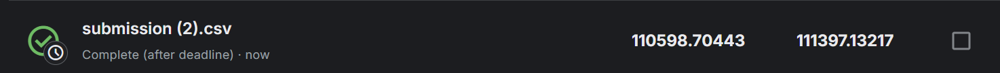